# Machine learining (PHYS 555) Jan 12 (2023), UVic.

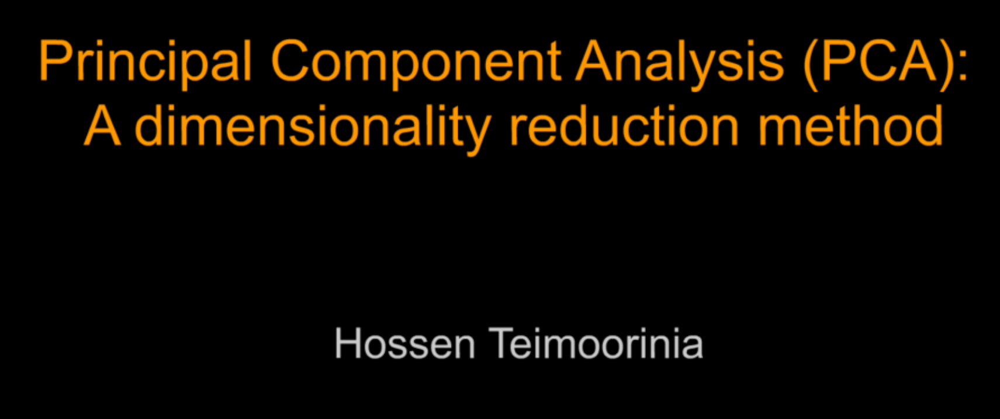

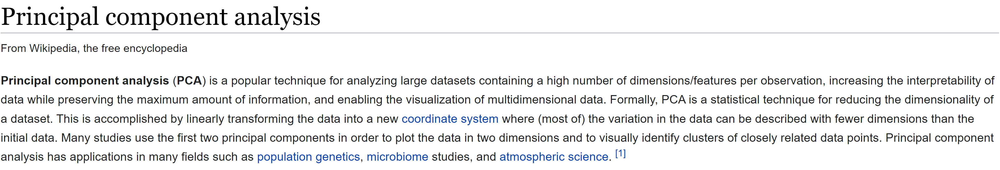

# Before that, a quick catch up


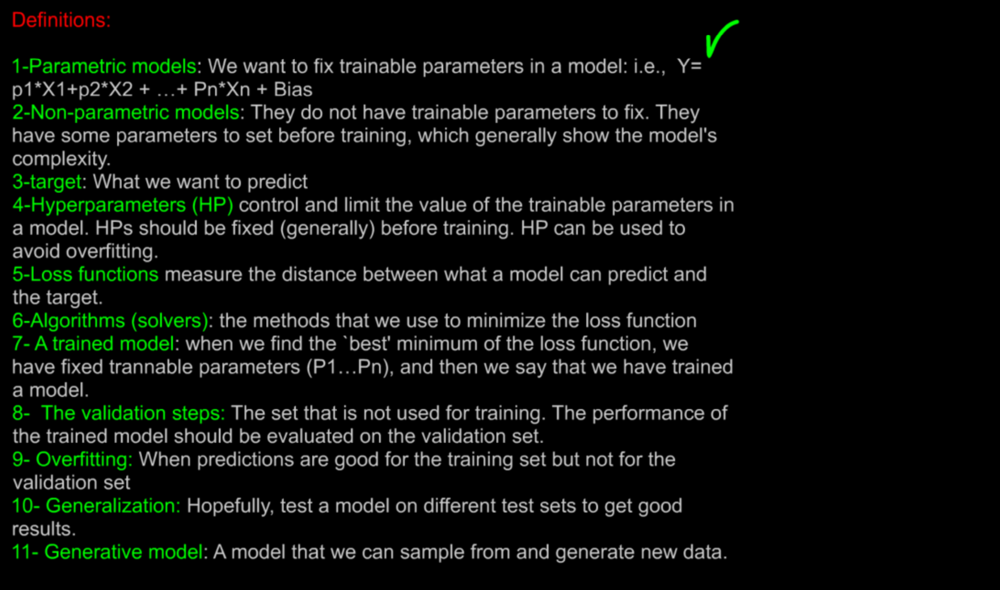

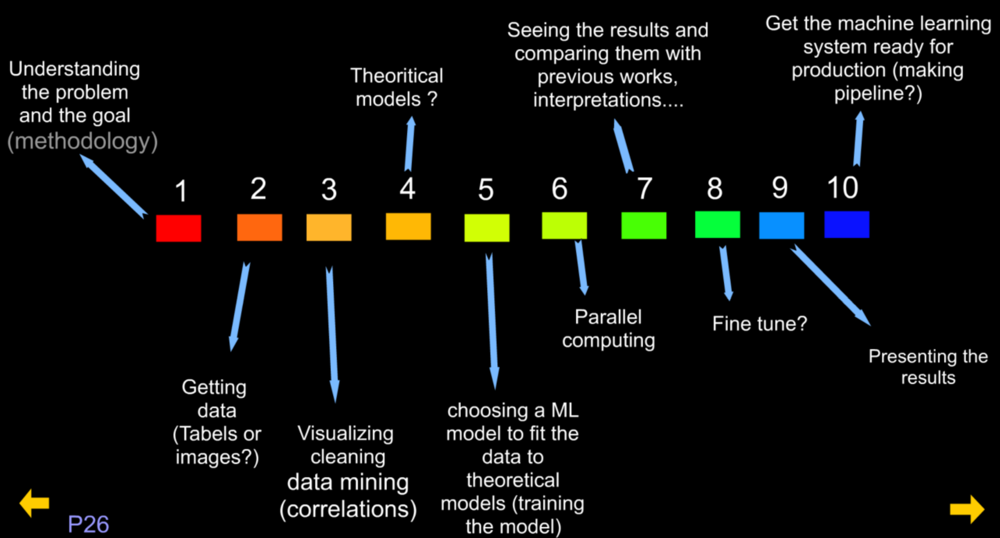

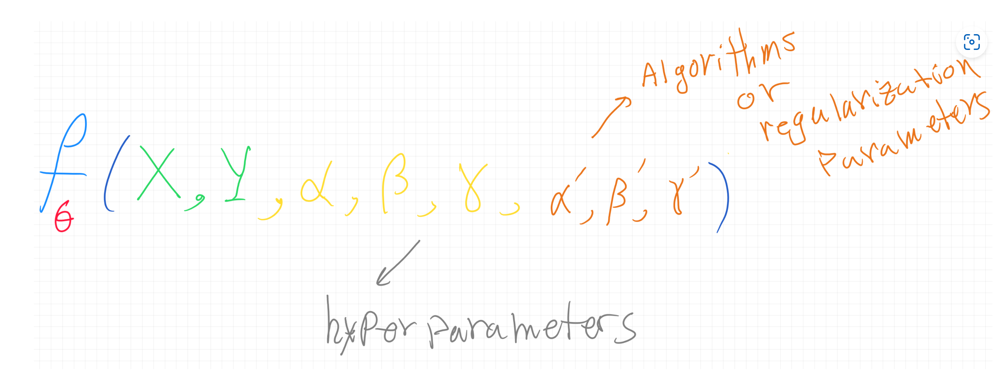
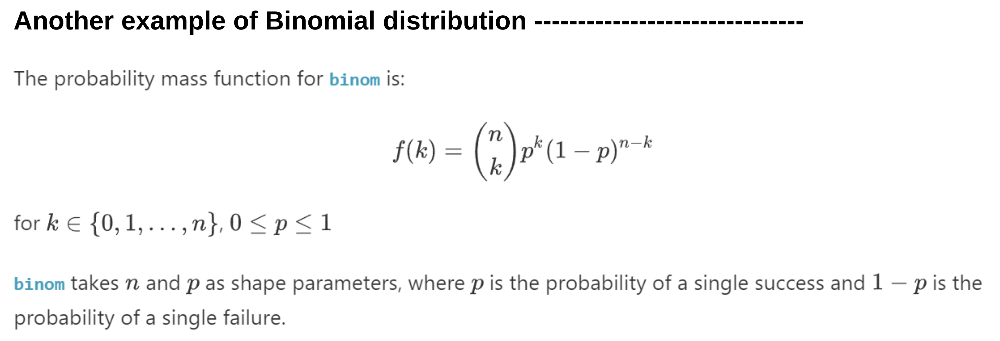
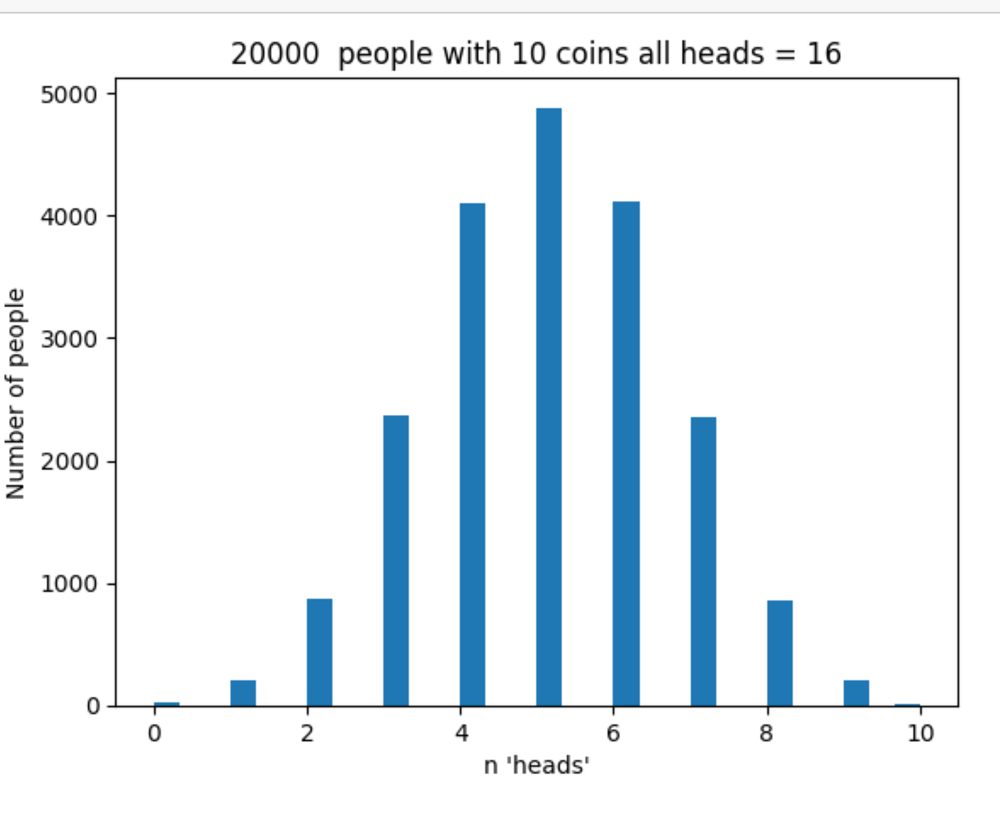

Text(0, 0.5, 'Weight')

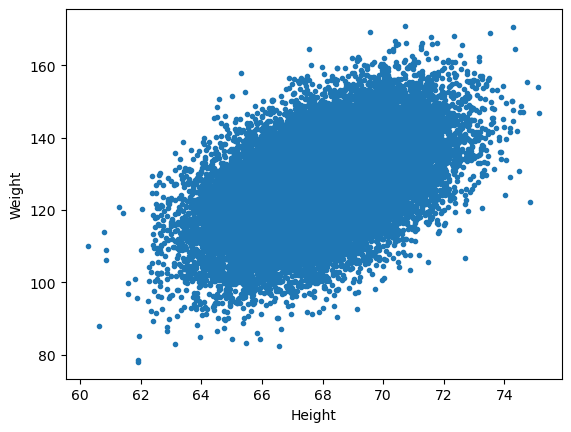

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
Excel_Data= pd.read_csv('Height_Weight.csv')
X1= Excel_Data[["Height"]].values   
X2= Excel_Data[["Weight"]].values
plt.plot(X1, X2,'.')
plt.xlabel('Height')
plt.ylabel('Weight')

{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}


Text(0, 0.5, 'X2 (True)')

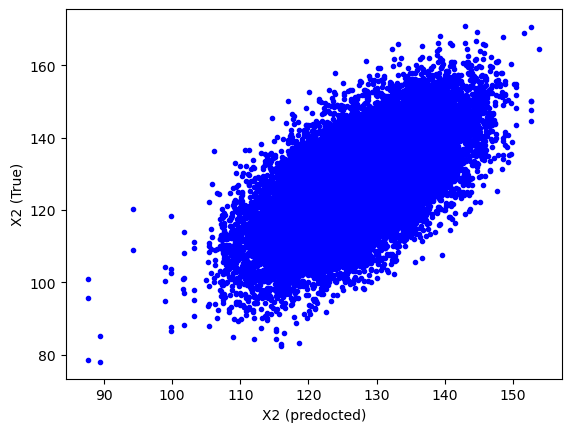

In [4]:
from sklearn.neighbors import KNeighborsRegressor  # choose your model

model = KNeighborsRegressor(n_neighbors=5)  # set the hyperparameters
model = KNeighborsRegressor(n_neighbors=5)  # set the hyperparameters
print (model.get_params())
model.fit(X1,X2)  # train it

X2_pre = model.predict(X1)

plt.plot(X2_pre,X2,'.b')
plt.xlabel('X2 (predocted)')
plt.ylabel('X2 (True)')


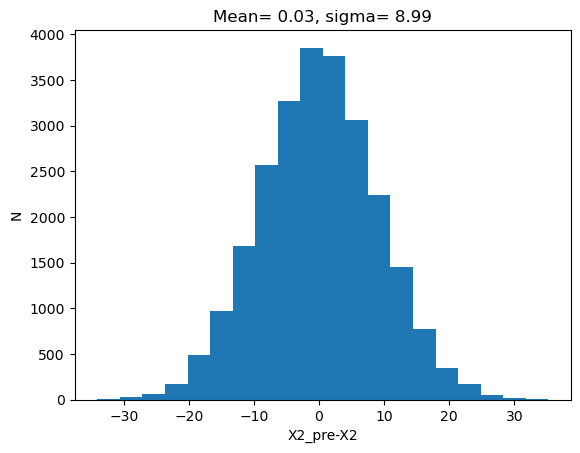

In [5]:
plt.hist(X2_pre-X2,20)
plt.title('Mean= '+str(np.round(np.mean(X2_pre-X2),2))+ ', sigma= '+str(np.round(np.std(X2_pre-X2),2)))
plt.xlabel('X2_pre-X2')
plt.ylabel('N')
plt.show()

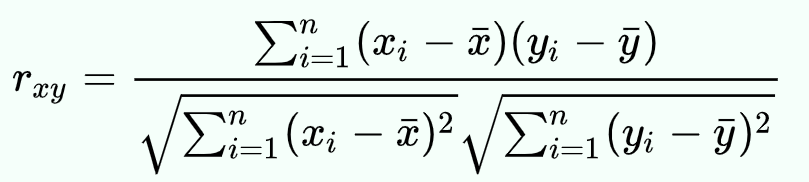

In [6]:
Excel_Data[["Height","Weight"]].corr()

,Height,Weight
Height,1.000000,0.502859
Weight,0.502859,1.000000


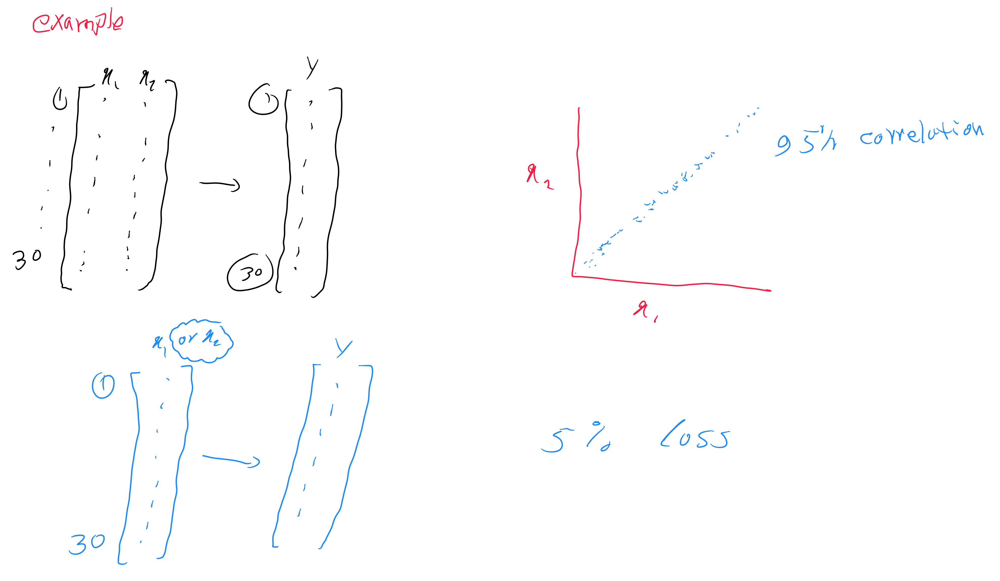

# Another issue is the data redundancy/similarity

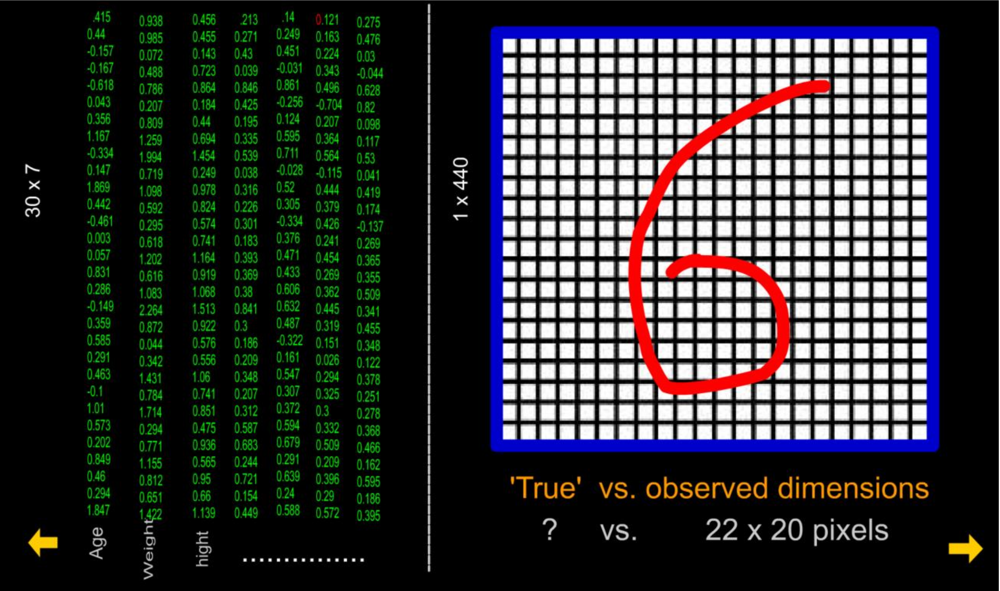

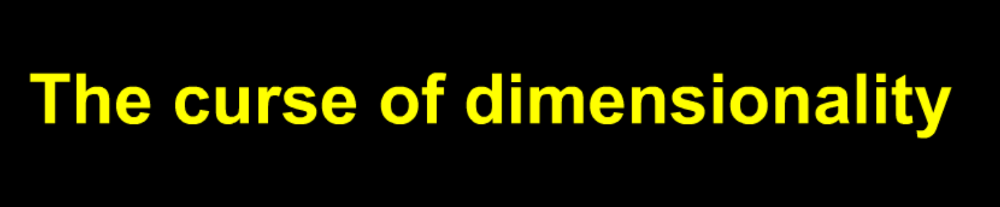

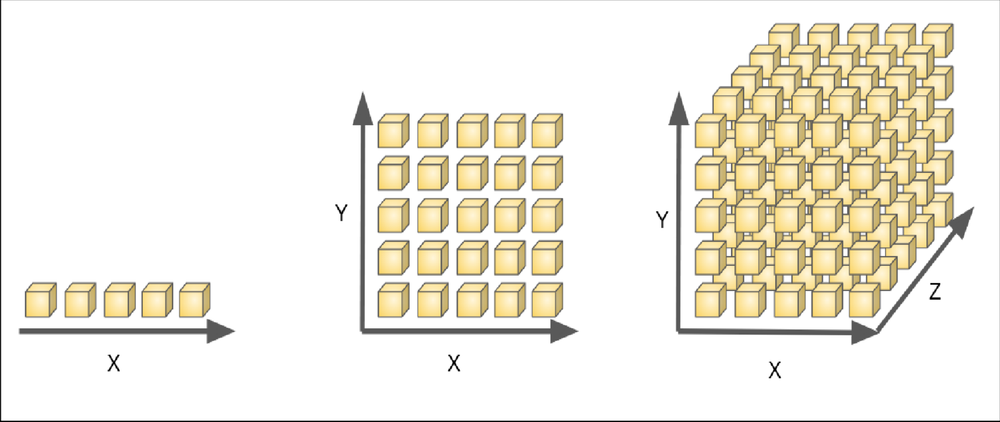

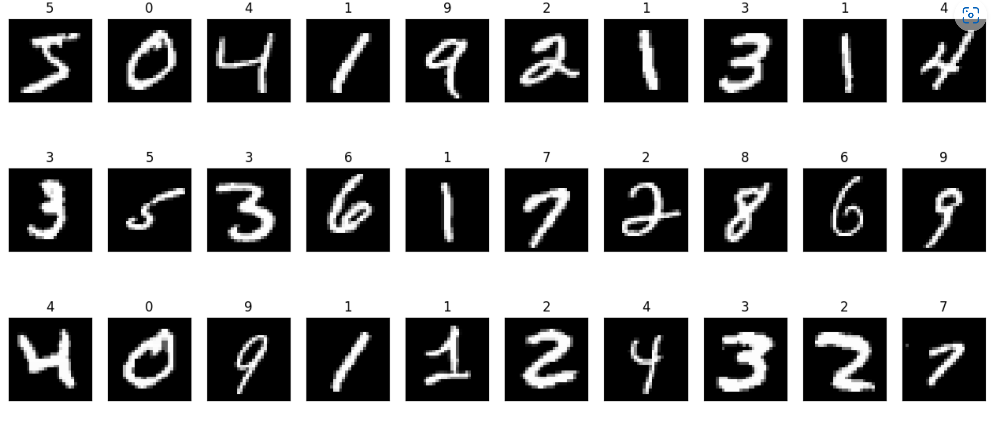

# It seems that many of the pixels on the following images are redundant 
# Choose the parts/pixels that can be ignored without losing much information

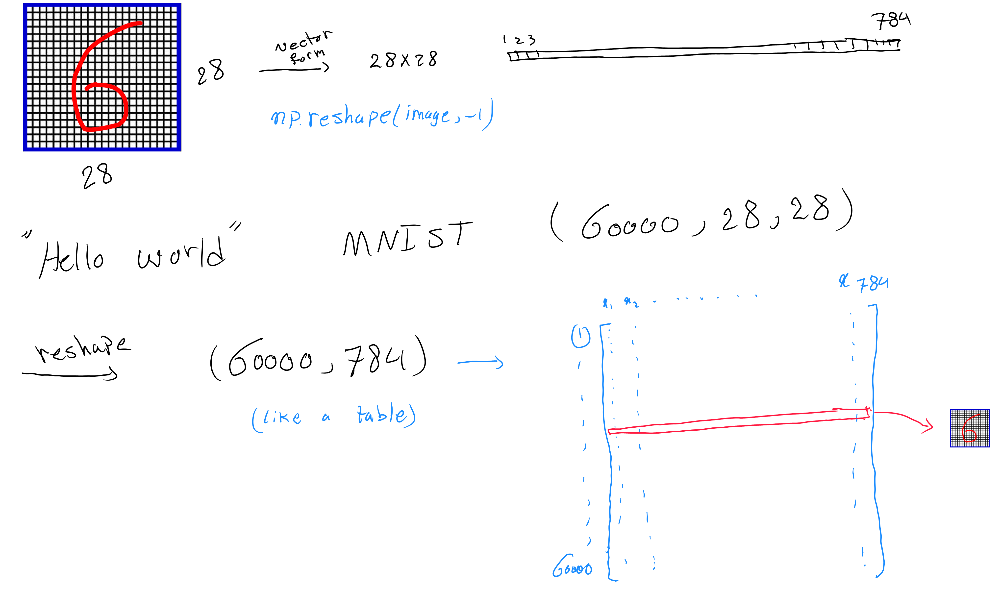

# What does PCA do?

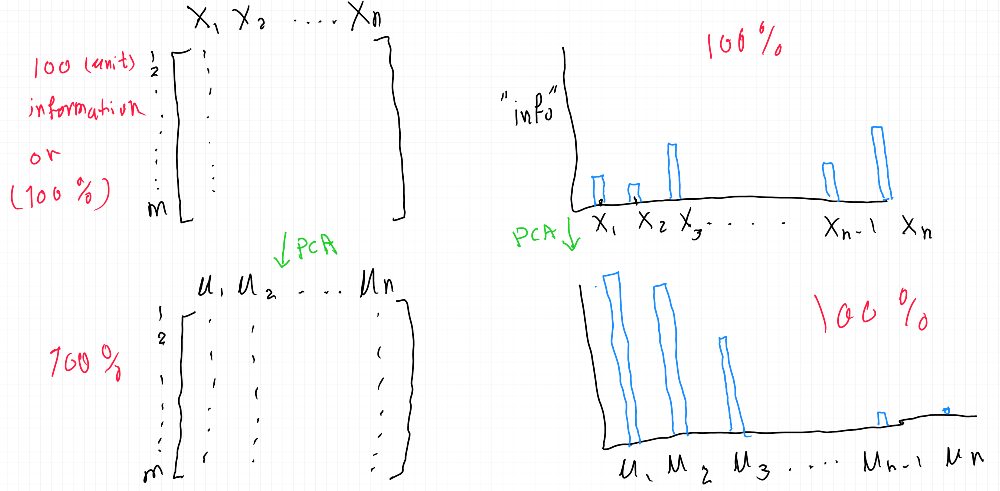

# HT: Flash presentation

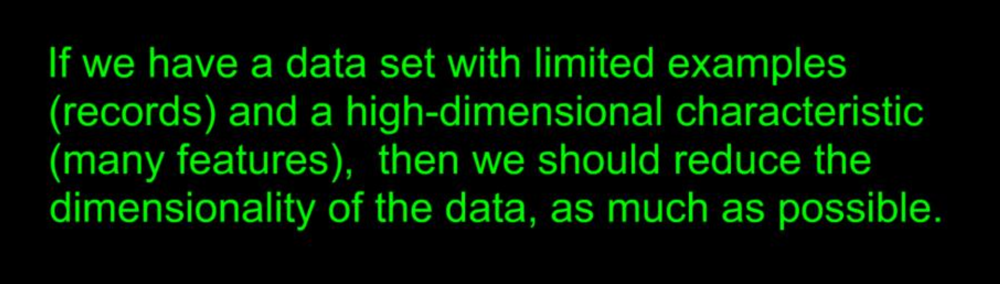

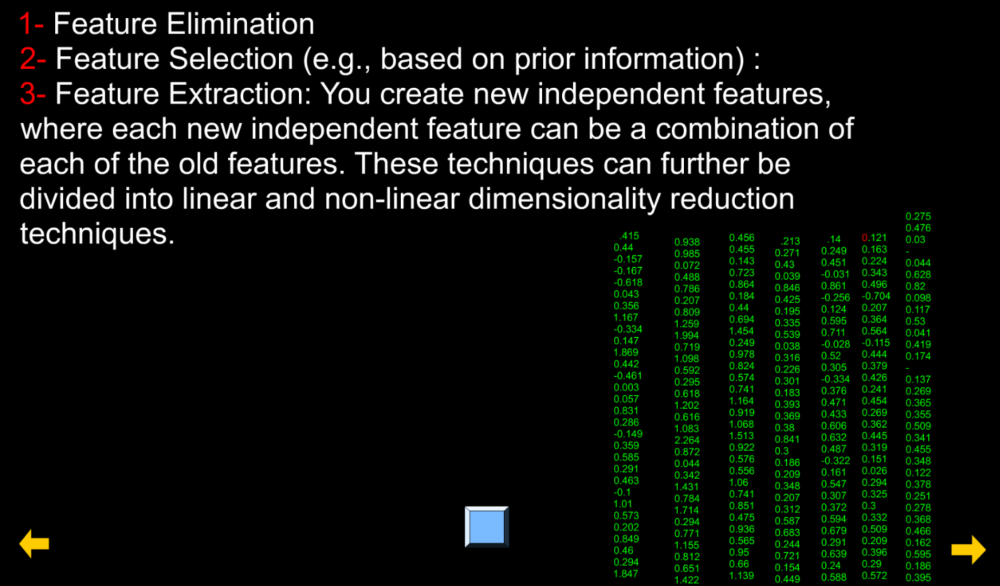

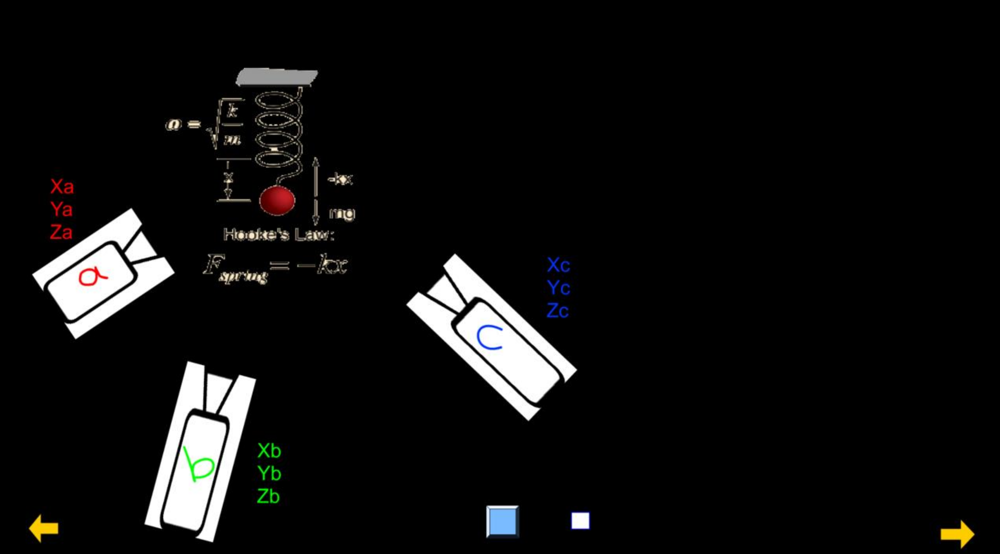

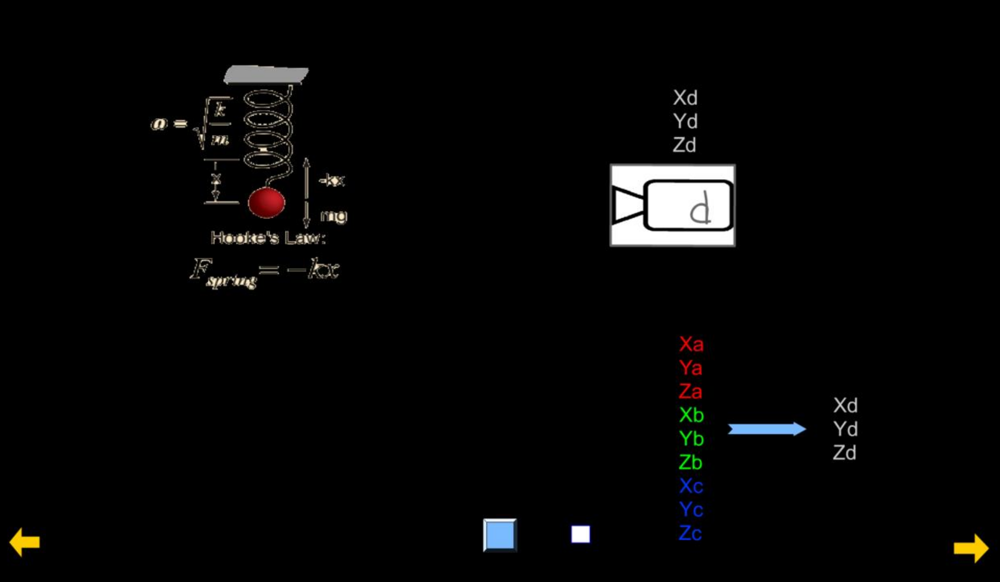

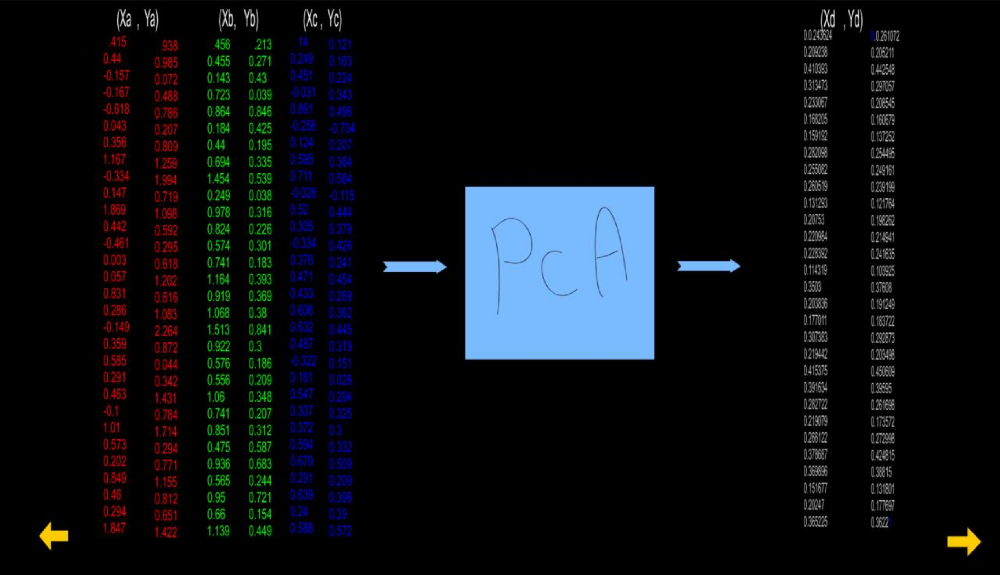

# We deal with information in a table or image. How do we quantify information? 

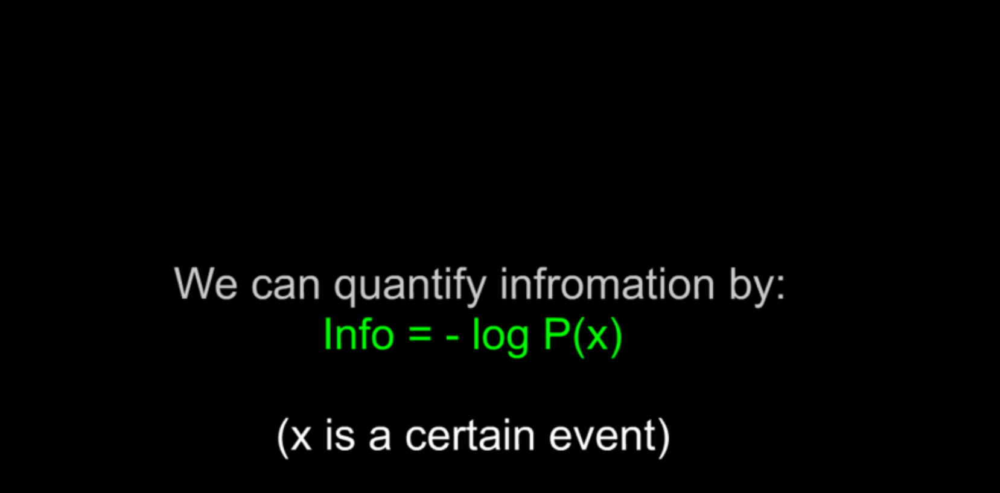

# Which of the following distributions has more information?

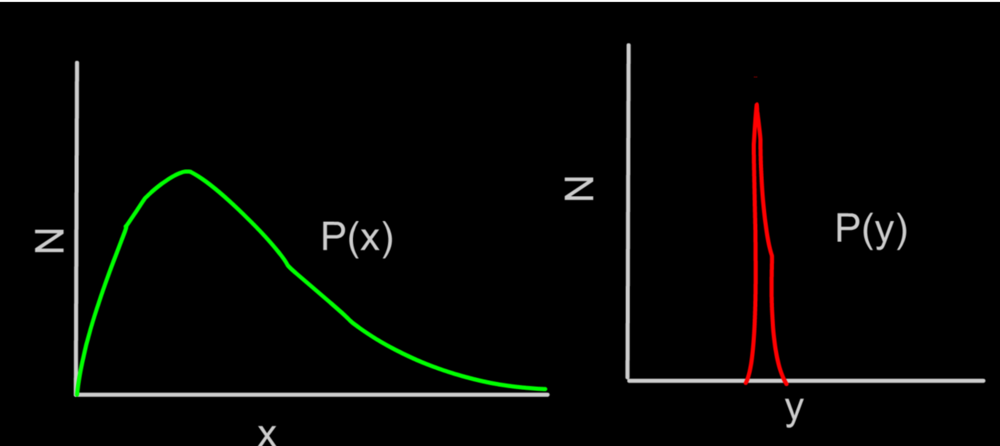

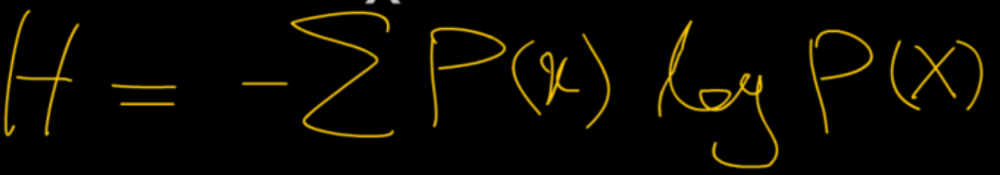

# Entropy

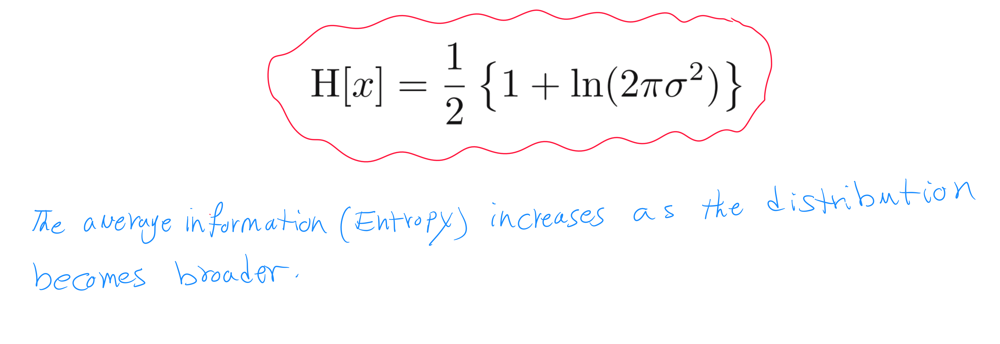

# Data preparation 

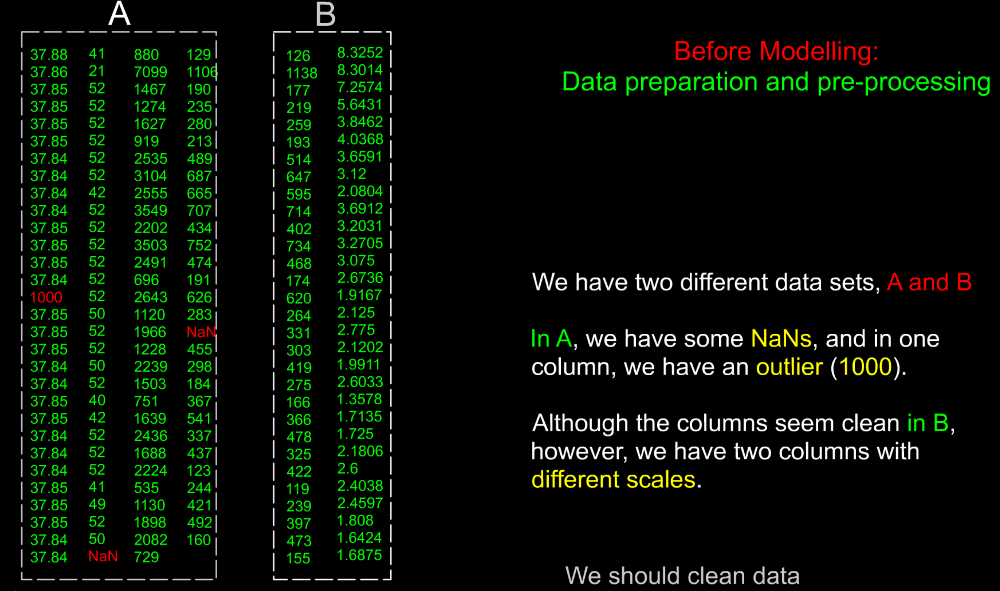

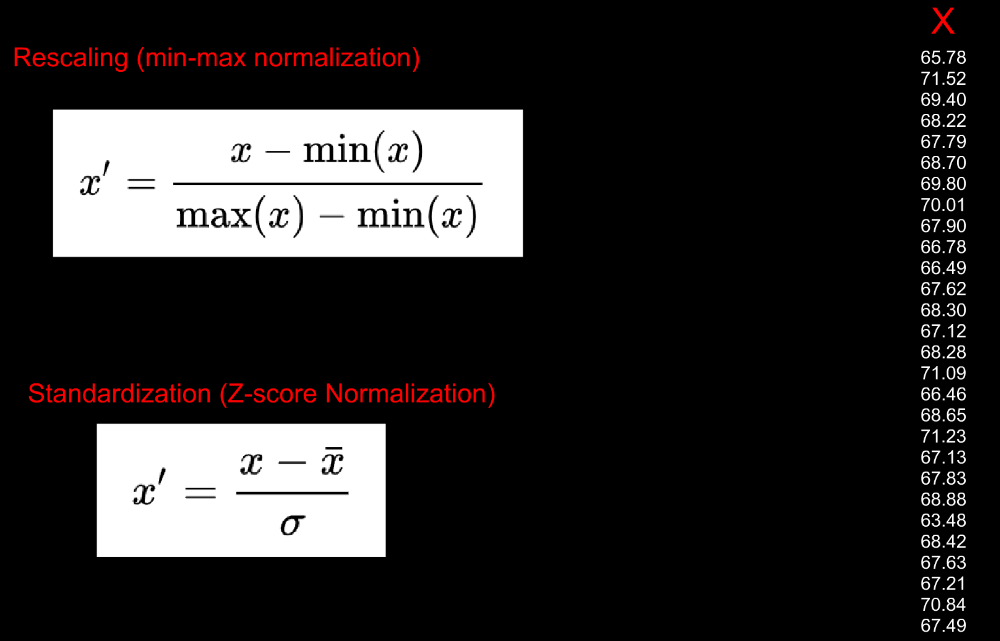

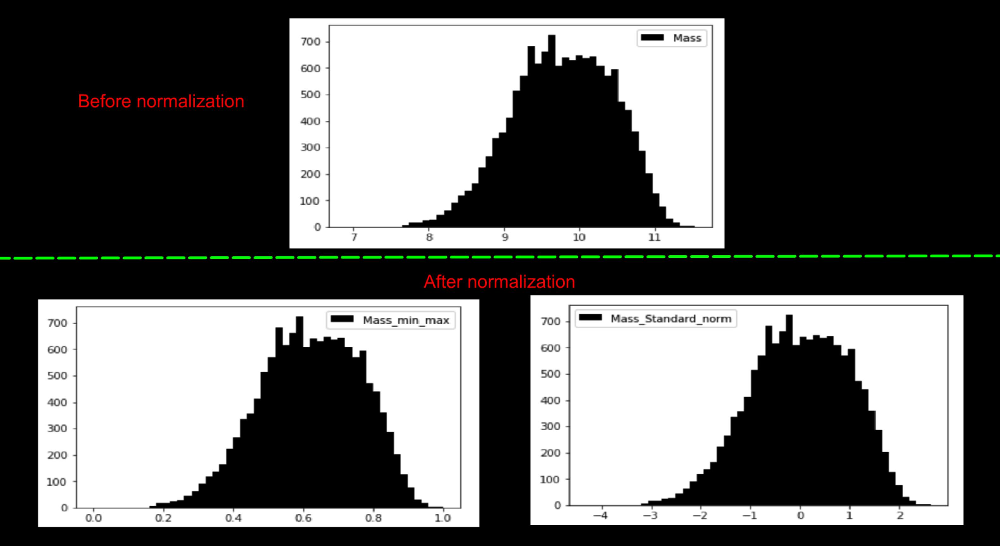

In [2]:
#loading packages

from sklearn.decomposition import PCA
from matplotlib import pyplot as plt
import numpy as np

In [3]:
## Getting MNIST data 


##Defining Input and target



from tensorflow.keras.datasets import mnist # load MNIST data

(inp_tr, tar_tr), (inp_va, tar_va) = mnist.load_data()

inp_tr = inp_tr/255.
inp_va = inp_va/255.


print ('Training set = ', np.shape(inp_tr),np.shape(tar_tr))
print ('Validation set = ', np.shape(inp_va),np.shape(tar_va))




Training set =  (60000, 28, 28) (60000,)
Validation set =  (10000, 28, 28) (10000,)


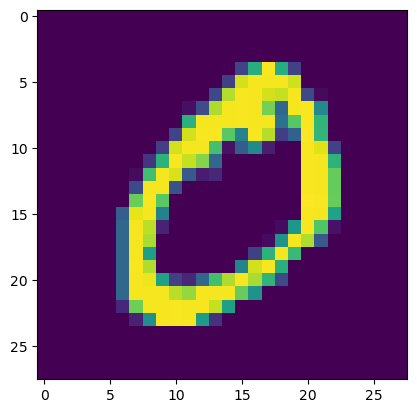

In [4]:
plt.imshow(inp_tr[1])

<Figure size 640x480 with 0 Axes>

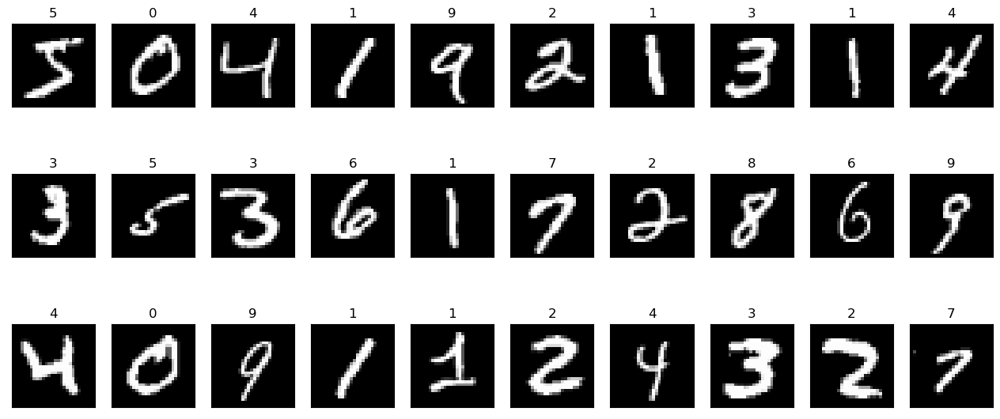

In [5]:
# presenting some digits

n1=0
n2=30
plt.gray()
fig = plt.figure( figsize=(16,7) )
for k1 in range(n1,n2):
    ax = fig.add_subplot(3,10,k1+1, title=str(int(tar_tr[k1])))
    ax.matshow(inp_tr[k1].reshape((28,28)).astype(float))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
plt.show()

# flatten the data 

In [6]:
inp_tr=np.reshape(inp_tr,(-1,28*28))
inp_va=np.reshape(inp_va,(-1,28*28))
print ('Training set = ', np.shape(inp_tr),np.shape(tar_tr))
print ('Validation set = ', np.shape(inp_va),np.shape(tar_va))

Training set =  (60000, 784) (60000,)
Validation set =  (10000, 784) (10000,)


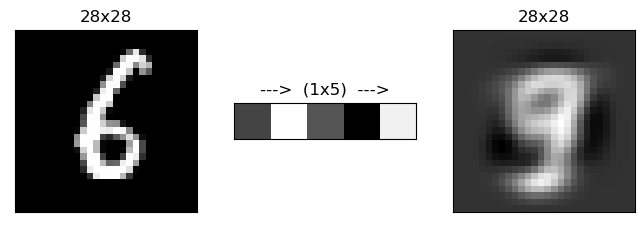

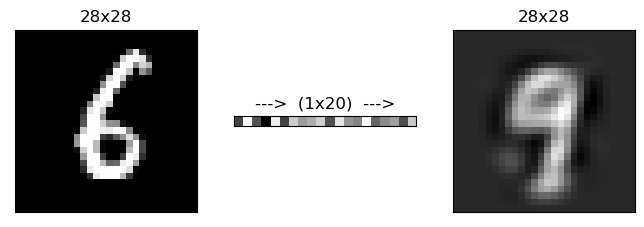

In [ ]:
# use the first 5 principle componets to reconstract an image  
# use the first 20 principle componets to reconstract the image
# use ....

n_pic = np.random.choice(np.arange(len(inp_va)))

for kc in [5,20, 50, 100, 400]:
    n_components=kc
    pca=PCA(n_components=n_components)


    pca.fit(inp_tr)
    inp_tr_pca = pca.transform(inp_tr)
    inp_va_pca = pca.transform(inp_va)

    sx= int(np.sqrt(n_components))
    sy= int(np.sqrt(n_components))
    plt.figure(n_pic, figsize=(8,8))
    approximation = pca.inverse_transform(inp_va_pca[n_pic]) # re-constract the image
    fig = plt.figure(n_pic)
    plt.subplot(1, 3, 1)
    plt.imshow(inp_tr[n_pic].reshape(28,28),cmap='gray')
    plt.title('28x28')
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1, 3, 2)
    plt.imshow(inp_va_pca[n_pic].reshape((-1, n_components)),cmap='gray')
    plt.title('--->  (1x'+str(n_components)+')  --->')
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1, 3, 3)
    plt.imshow(approximation.reshape(28,28),cmap='gray')
    plt.title('28x28')
    plt.xticks([])
    plt.yticks([])




    plt.show()

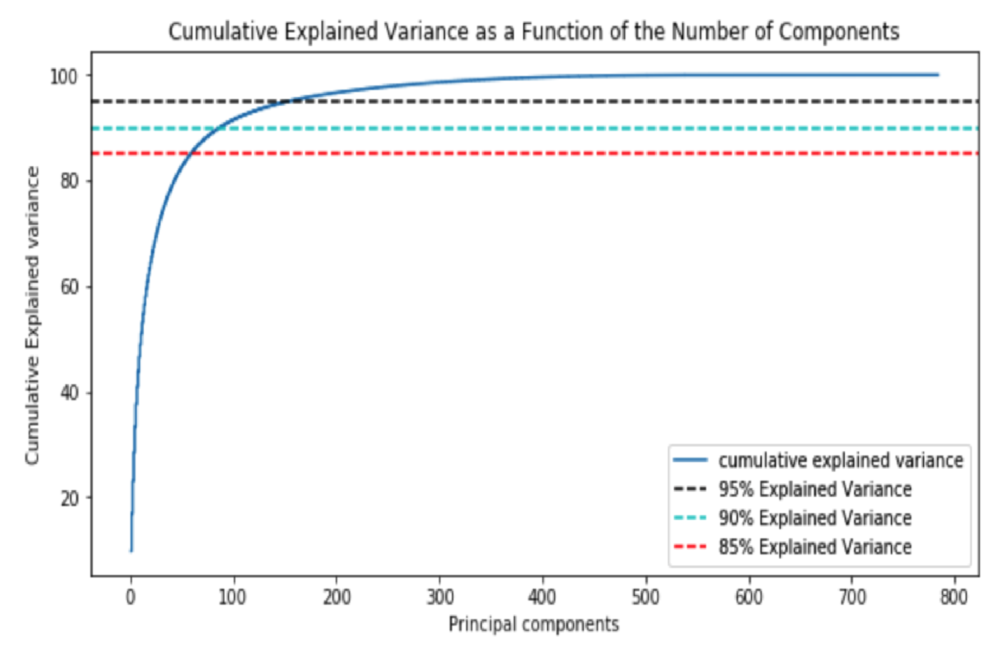

(713, 7)

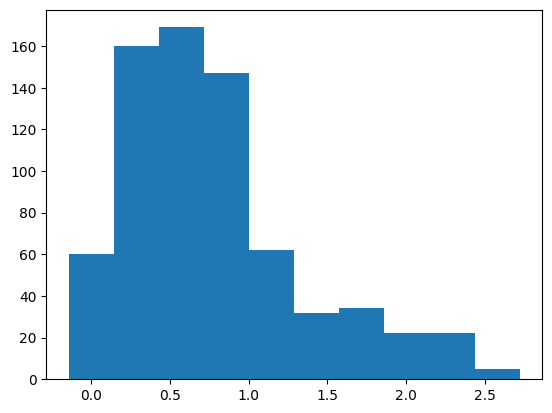

In [11]:
inp_red= np.load('inp_redshift.npy')
tar_red=np.load('tar_redshift.npy')
plt.hist(inp_red[:,1])
np.shape(inp_red)

(713, 7)

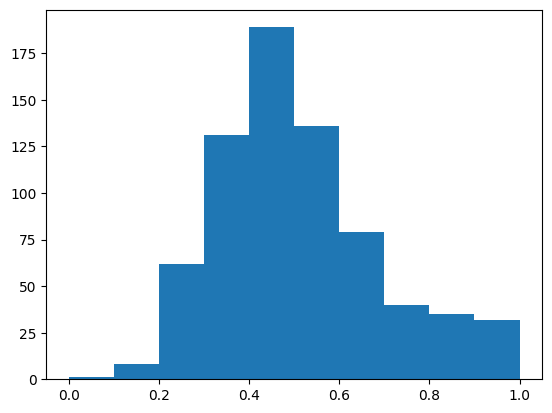

In [12]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
sc = MinMaxScaler()
sc.fit(inp_red)
inp_red_norm = sc.transform(inp_red)




#inp_red_norm= inp_red-np.mean(inp_red)  # centered (normalized); another way of normalization

plt.hist(inp_red_norm[:,2])
np.shape(inp_red_norm)

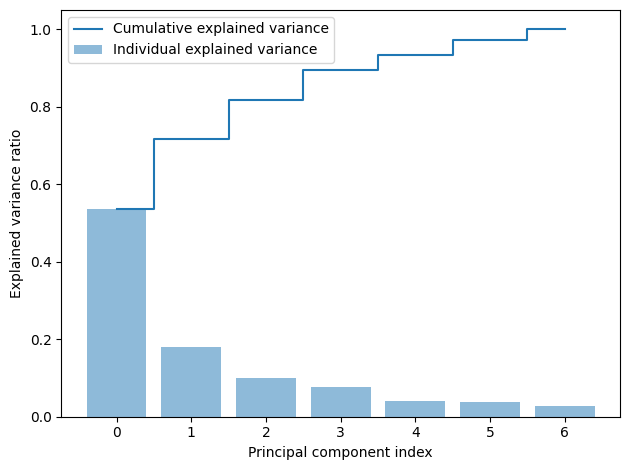

In [13]:
from sklearn.preprocessing import StandardScaler

pca = PCA()
#
# Determine transformed features
#
inp_red_pca = pca.fit_transform(inp_red_norm)
#
# Determine explained variance using explained_variance_ration_ attribute
#
exp_var_pca = pca.explained_variance_ratio_
#
# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#
# Create the visualization plot
#
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [14]:
pca = PCA(n_components=4)

In [15]:
inp_red_pca = pca.fit_transform(inp_red_norm)

In [16]:
np.shape(inp_red_pca)

(713, 4)

{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}


Text(0.5, 1.0, 'With PCA')

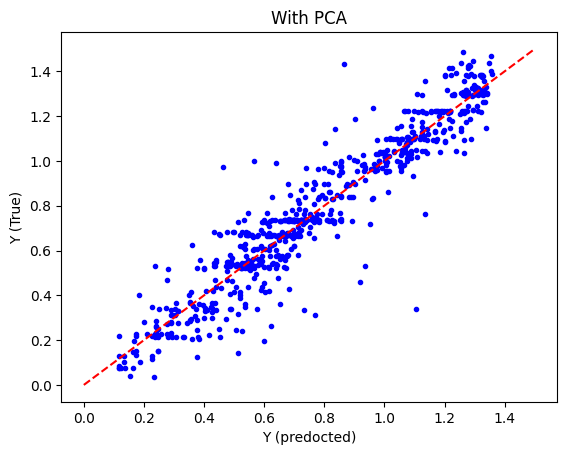

In [17]:
from sklearn.neighbors import KNeighborsRegressor  # choose your model

model = KNeighborsRegressor(n_neighbors=5)  # set the hyperparameters
print (model.get_params())
model.fit(inp_red_pca,tar_red)  # train it

Y_pre = model.predict(inp_red_pca)

plt.plot(Y_pre,tar_red,'.b')
plt.xlabel('Y (predocted)')
plt.ylabel('Y (True)')
plt.plot([0,1.5],[0,1.5],'--r')

plt.title('With PCA')

{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}


Text(0.5, 1.0, 'Without PCA')

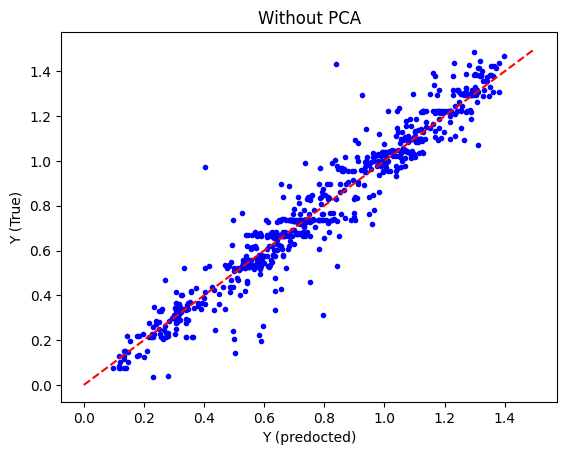

In [18]:
from sklearn.neighbors import KNeighborsRegressor  # choose your model

model = KNeighborsRegressor(n_neighbors=5)  # set the hyperparameters
print (model.get_params())
model.fit(inp_red,tar_red)  # train it

Y_pre = model.predict(inp_red)

plt.plot(Y_pre,tar_red,'.b')
plt.xlabel('Y (predocted)')
plt.ylabel('Y (True)')
plt.plot([0,1.5],[0,1.5],'--r')
plt.title('Without PCA')

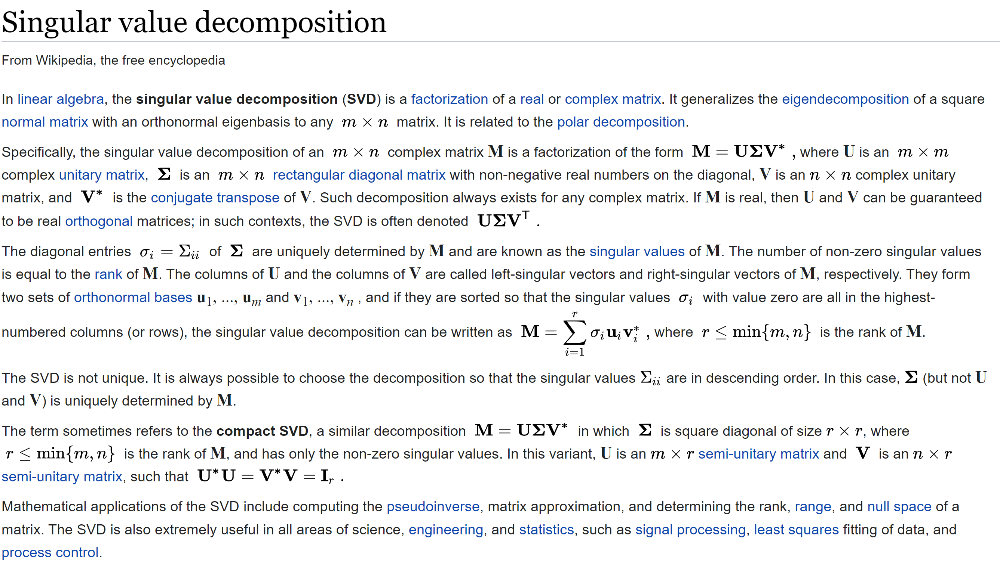

In [19]:
from PIL import Image
from tensorflow.keras.preprocessing.image import img_to_array
image = Image.open('img-flower2.jpg')
image = img_to_array(image)
image.shape

(934, 1052, 3)

In [20]:
img =np.mean(image,axis=2)
img.shape

(934, 1052)

(934, 1052)

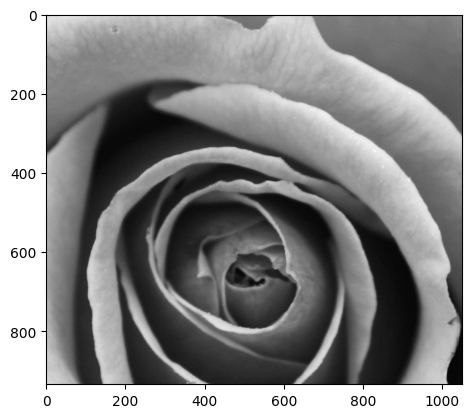

In [21]:
plt.imshow(img,'gray')
img.shape

In [22]:
X_centered = img - img.mean()
U, sigma, V = np.linalg.svd(X_centered)
print (U.shape)

(934, 934)


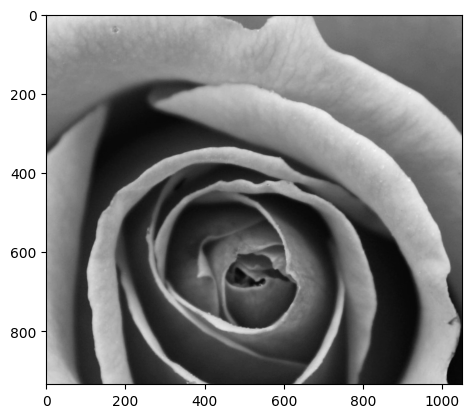

In [23]:
a=0
b=900
reconstructed= np.matrix(U[:, a:b]) * np.diag(sigma[a:b]) * np.matrix(V[a:b, :])


plt.imshow(reconstructed,'gray')

In [24]:
# show an example of an Assignment 

# Assignment 1 
1- Do PCA for the alfalfa and wine data set. plot the explained variance ratio vs. the principle components for each data set.  
2- SVD for face recognition. Explain how it works and show some examples. Bonus: if you can implement it on a (B&W) image data set.
